# Finite-Time Lyapunov Exponent (FTLE)
In this example, we will compute the finite-time Laypunov exponent (FTLE) field for a co-rotating vortex pair.

In [1]:
using ILMPostProcessing
using ViscousFlow
using Plots

## Setup the Co-rotating Vortices Problem
The grid Re number is chosen at 10.0 to speed up computations.

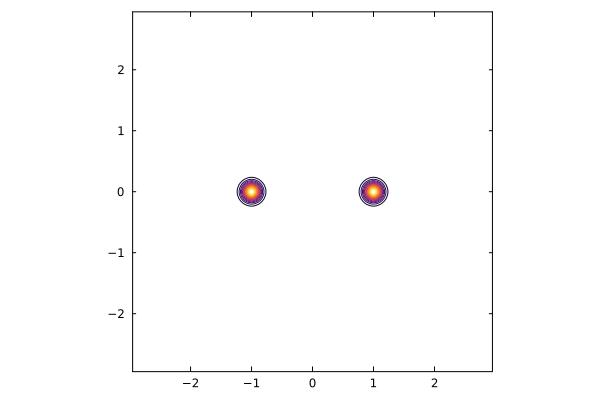

In [2]:
my_params = Dict()
my_params["Re"] = 300
xlim = (-3.0,3.0)
ylim = (-3.0,3.0)
my_params["grid Re"] = 10.0

g = setup_grid(xlim,ylim,my_params)

sys = viscousflow_system(g,phys_params=my_params)

σ = 0.1
x01, y01 = 1.0, 0.0
x02, y02 = -1.0, 0.0
A = 3
twogauss = SpatialGaussian(σ,σ,x01,y01,A) + SpatialGaussian(σ,σ,x02,y02,A)

u0 = init_sol(twogauss,sys)

plot(vorticity(u0,sys,0.0),sys)

## Solve the Problem
Step the integrator repeatedly until the solution is generated for t = (0.0, 18.0).

 27.049942 seconds (4.93 M allocations: 9.337 GiB, 2.22% gc time, 7.20% compilation time)


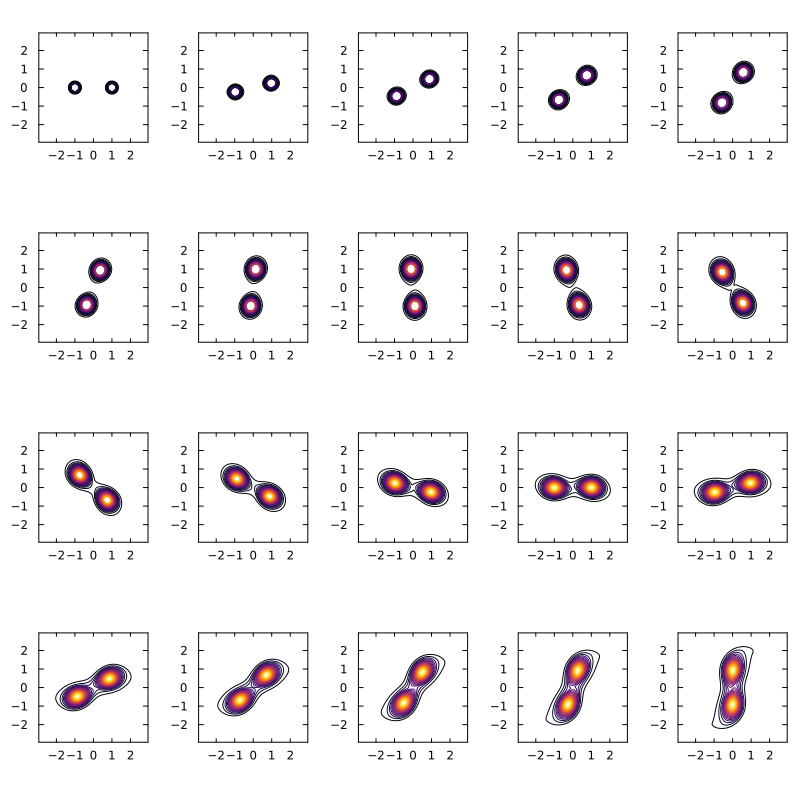

In [3]:
T = 19.0
tspan = (0.0,T)
integrator = init(u0,tspan,sys)

@time begin
    step!(integrator,T)
end

sol = integrator.sol

plt = plot(layout = (4,5), size = (800, 800), legend=:false)
tsnap = 0.0:1.0:T
for (i, t) in enumerate(tsnap)
    plot!(plt[i],vorticity(sol,sys,t),sys,levels=range(0.1,5,length=31))
end
plt

## Generate a Sequence of Velocity Fields
This step obtains the computed velocity field at a sequence of times, and stores them as a sequence of interpolatable
fields in `velseq`. This will greatly speed up the steps in which we compute the flow deformation fields.

In [4]:
t_start = 0.0
t_end = 19.0
dt = timestep(u0,sys)
tr = t_start:dt:t_end

velxy = velocity_xy(sol,sys,tr) # Vector of interpolatable velocities
velseq = VectorFieldSequence(tr,velxy); # Bundle together with the time array

## Generate Initial Conditions
Here, we generate a grid of initial locations from which to integrate
trajectories.

In [5]:
X_MIN = -2.0
X_MAX = 2.0
Y_MIN = -2.0
Y_MAX = 2.0
dx = 0.01
ftlegrid = PhysicalGrid((X_MIN,X_MAX),(Y_MIN,Y_MAX),dx,optimize=false)
ftle_cache = SurfaceScalarCache(ftlegrid)
x0, y0 = x_grid(ftle_cache), y_grid(ftle_cache)

(CartesianGrids.Primal nodes in a (nx = 402, ny = 402) cell grid of type Float64 data
  Number of CartesianGrids.Primal nodes: (nx = 401, ny = 401), CartesianGrids.Primal nodes in a (nx = 402, ny = 402) cell grid of type Float64 data
  Number of CartesianGrids.Primal nodes: (nx = 401, ny = 401))

## Solve the IVP and Generate FTLE Fields
### Computing the FTLE Field at One Time Snapshot
To compute the particle displacement field, we choose an integration time `T`.
We also choose a time `t0` at which we desire to see the FTLE field. Note
that we will compute both a forward and backward time FTLE field at `t0`, so
we need to ensure we have velocity data available from `t0 - T` to `t0 + T`.

For integration purposes we use the forward Euler method, but any time marching
method can be used.

In [6]:
T = 6.0
t0 = 6.0

6.0

The forward displacement field and FTLE field

In [7]:
xf, yf = displacement_field(velseq,x0,y0,(t0,t0+T),alg=Euler())

fFTLE = similar(x0)
compute_FTLE!(fFTLE,xf,yf,dx,dx,T);

and now the backward displacement field and FTLE field. We don't actually
need to specify the `alg` because `Euler()` is the default.

In [8]:
xb, yb = displacement_field(velseq,x0,y0,(t0,t0-T))

bFTLE = similar(x0)
compute_FTLE!(bFTLE,xb,yb,dx,dx,T);

Plot the fields on top of each other

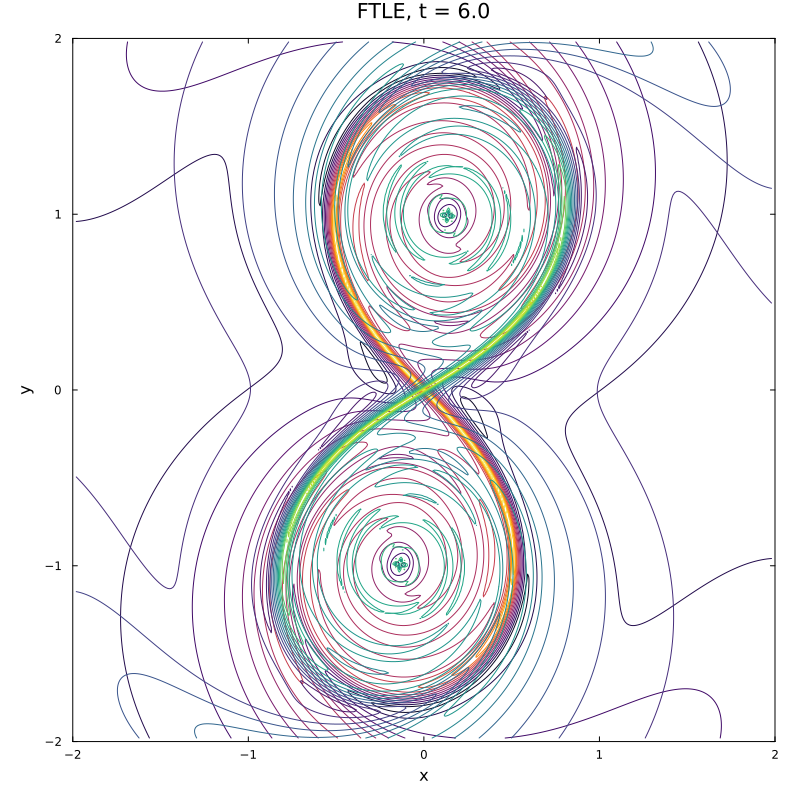

In [9]:
plot(fFTLE,ftle_cache,color=:inferno,size=(800,800))
plot!(bFTLE,ftle_cache,color=:viridis,xlim=(-2,2),ylim=(-2,2),title="FTLE, t = $t0", xlabel="x", ylabel="y")

### Computing the FTLE Fields at a Range of Times
Let's see some blocks of particles and how they move as the FTLE field evolves.
The example places initial points at `t = 6` near the unstable manifold (orange).
We will compute the FTLE field after 4 time units (`t = 10`) and see the particles.
The initial block of points is roughly colored according to which side of this
manifold it is on.

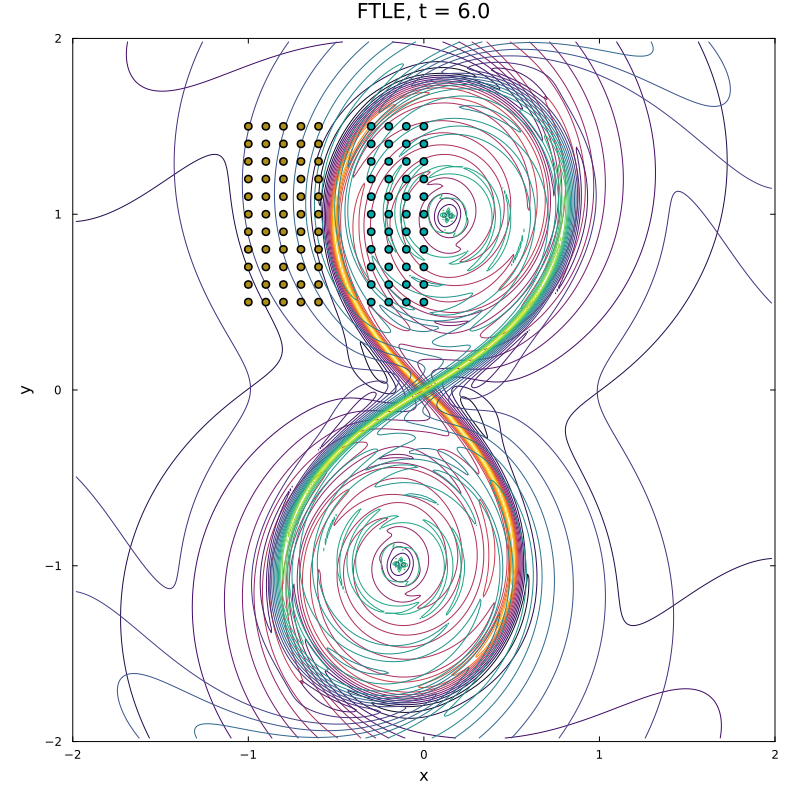

In [10]:
xp_min = -1.0
xp_max = 0.0
yp_min = 0.5
yp_max = 1.5
dxp = 0.1
p_grid = PhysicalGrid((xp_min,xp_max),(yp_min,yp_max),dxp,optimize=false)
p_cache = SurfaceScalarCache(p_grid);
xp0, yp0 = x_grid(p_cache), y_grid(p_cache);

plot(fFTLE,ftle_cache,color=:inferno,size=(800,800))
plot!(bFTLE,ftle_cache,color=:viridis,xlim=(-2,2),ylim=(-2,2),title="FTLE, t = $t0", xlabel="x", ylabel="y")
scatter!(vec(xp0[1:5,1:end]),vec(yp0[1:5,1:end]))
scatter!(vec(xp0[8:end,1:end]),vec(yp0[8:end,1:end]))

Now we will advance the block of particles to `t = 10` and compute the FTLE fields
at that instant.

In [11]:
t0_ftle = 10.0
xpf, ypf = displacement_field(velseq,xp0,yp0,(t0,t0_ftle))

xf, yf = displacement_field(velseq,x0,y0,(t0_ftle,t0_ftle+T))
compute_FTLE!(fFTLE,xf,yf,dx,dx,T)

xb, yb = displacement_field(velseq,x0,y0,(t0_ftle,t0_ftle-T))
compute_FTLE!(bFTLE,xb,yb,dx,dx,T);

Now plot the FTLE fields and particles

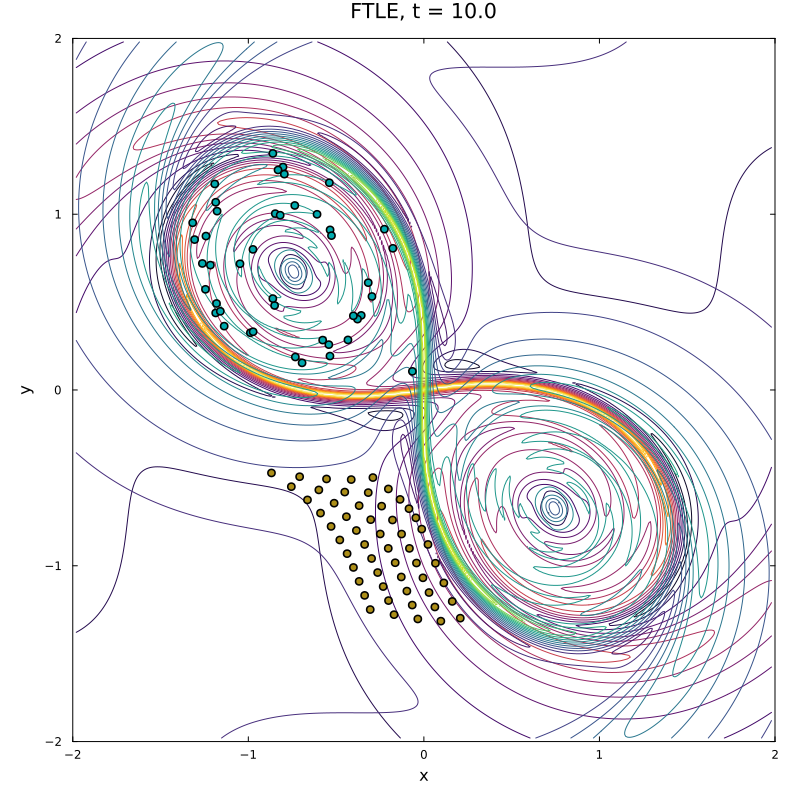

In [12]:
plot(fFTLE,ftle_cache,color=:inferno,size=(800,800))
plot!(bFTLE,ftle_cache,color=:viridis,xlim=(-2,2),ylim=(-2,2),title="FTLE, t = $t0_ftle", xlabel="x", ylabel="y")
scatter!(vec(xpf[1:5,1:end]),vec(ypf[1:5,1:end]))
scatter!(vec(xpf[8:end,1:end]),vec(ypf[8:end,1:end]))

The code here creates a gif

    @gif for t0_ftle in 6.5:0.5:12.0
        print(t0_ftle)

        xpf, ypf = displacement_field(velseq,xp0,yp0,(t0,t0_ftle))

        xf, yf = displacement_field(velseq,x0,y0,(t0_ftle,t0_ftle+T))
        compute_FTLE!(fFTLE,xf,yf,dx,dx,T)
        xb, yb = displacement_field(velseq,x0,y0,(t0_ftle,t0_ftle-T))
        compute_FTLE!(bFTLE,xb,yb,dx,dx,T)

        plot(fFTLE,ftle_cache,color=:inferno,size=(800,800))
        plot!(bFTLE,ftle_cache,color=:viridis,xlim=(-2,2),ylim=(-2,2),title="FTLE, t = $t0_ftle", xlabel="x", ylabel="y")
        scatter!(vec(xpf[1:5,1:end]),vec(ypf[1:5,1:end]))
        scatter!(vec(xpf[8:end,1:end]),vec(ypf[8:end,1:end]))

    end every 1 fps = 2

---

*This notebook was generated using [Literate.jl](https://github.com/fredrikekre/Literate.jl).*